# Overview

First attempt at creating the image similarity using [Reset](https://pytorch.org/vision/main/models/resnet.html), [Deep Lake Vector Search](https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search), and [WikiArt](https://datasets.activeloop.ai/docs/ml/datasets/wiki-art-dataset/).

*This is a work in progess, citations and references will be added as the project progresses.*

**NOTE:** I have not uploaded the `images`, `vector-store`, and `grey-test-images` folders to avoid massive uploads. All of the folders should automatically be created when running the code. `test-images` is in the data folder and can be edited as you want.

## Conclusions

* Vector Embeddings will be the slowest part of the process; if we can have a saved version of the embeddings, eveything else will be faster.
* WikiArt has a lot of art that needs some cleaning.
* It should be very easy to get the closest images if we use the vector embeddings.

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch import nn
import deeplake
from torchvision import transforms, models, datasets
import flask
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore
import os
import torch
from torchvision.models.feature_extraction import create_feature_extractor
from PIL import Image

/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c1017RegisterOperatorsD1Ev
  Referenced from: <2BDBC688-E93D-38EE-BBB2-E3BEEEAB3977> /Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torchvision/image.so
  Expected in:     <F37A8933-BE2B-34BD-AE9A-CEE18F73F614> /Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torch/lib/libtorch_cpu.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found.

## Load Data

In [2]:
# Load WikiArt
ds = deeplake.load('hub://activeloop/wiki-art')


# Create transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

dataloader = ds.pytorch(transform=transform, batch_size=32, shuffle=True, tensors=['images', 'labels'])

Opening dataset in read-only mode as you don't have write permissions.


\

This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/activeloop/wiki-art



-

hub://activeloop/wiki-art loaded successfully.



/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/deeplake/integrations/pytorch/common.py:137: UserWarning: Decode method for tensors ['images'] is defaulting to numpy. Please consider specifying a decode_method in .pytorch() that maximizes the data preprocessing speed based on your transformation.
  warnings.warn(


## Visualize Data

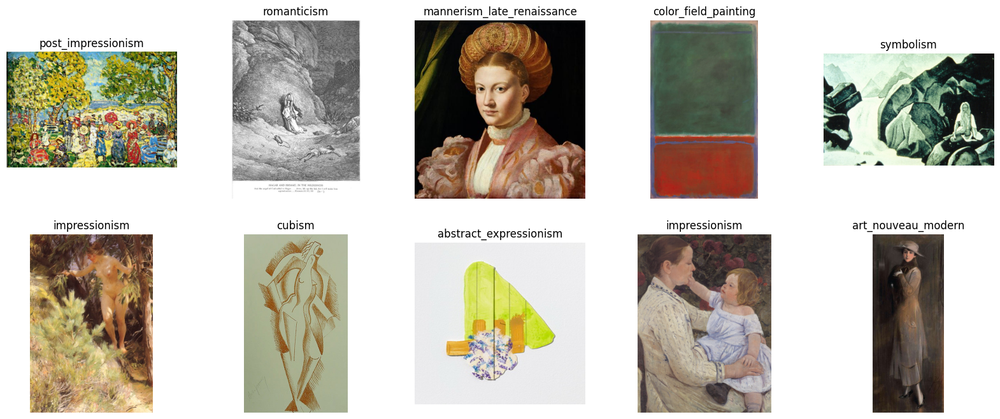

In [3]:
# Show the first 10 images

# Create a grid of images
fig, ax = plt.subplots(2, 5, figsize=(20, 8))

# Get 10 random indices
indices = range(0, len(ds))
indices = np.random.choice(indices, 10, replace=False)
indices = [int(i) for i in indices]

# Plot the images
for i, index in enumerate(indices):
    img = ds.images[index].numpy()
    label = ds.labels[index].data()
    title = label['text'][0]
    ax[i // 5, i % 5].imshow(img)
    ax[i // 5, i % 5].set_title(title)
    ax[i // 5, i % 5].axis('off')

In [4]:
ds.summary()

Dataset(path='hub://activeloop/wiki-art', read_only=True, tensors=['images', 'labels'])

 tensor      htype                 shape               dtype  compression
 -------    -------               -------             -------  ------- 
 images      image     (81433, 50:9541, 63:15530, 3)   uint8    jpeg   
 labels   class_label           (81433, 1)            uint32    None   


In [5]:
ds.visualize()

HINT: Please forward the port - 65350 to your local machine, if you are running on the cloud.
 * Serving Flask app 'dataset_visualizer'
 * Debug mode: off


# Create Model

## Import ResNet Model

Here I use 34, but 18 was also ok. Anything larger is too big to run on my laptop.

In [19]:
from torchvision.models.feature_extraction import create_feature_extractor

# Check if GPU is available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Load the model
model = models.mastering_models.resnet18(pretrained=True)

# Create a feature extractor
return_nodes = {
    'avgpool': 'embedding'
}
model = create_feature_extractor(model, return_nodes=return_nodes)

# Freeze the model
model.eval()
model.to(device)

/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /Users/Austin/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 44.7MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Module(
    (0): Module(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): Module(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2):

## Create Image Embeddings

In [20]:
# Image transformation
# From https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search
tform= transforms.Compose([
    transforms.Resize((224,224)), 
    transforms.ToTensor(),
    transforms.Lambda(lambda x: torch.cat([x, x, x], dim=0) if x.shape[0] == 1 else x),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# From https://docs.activeloop.ai/example-code/tutorials/vector-store/image-similarity-search
def embedding_function(images, model = model, transform = tform, batch_size = 4):
    """Creates a list of embeddings based on a list of image filenames. Images are processed in batches."""

    if isinstance(images, str):
        images = [images]

    # Proceess the embeddings in batches, but return everything as a single list
    embeddings = []
    for i in range(0, len(images), batch_size):
        batch = torch.stack([transform(Image.open(item)) for item in images[i:i+batch_size]])
        batch = batch.to(device)
        with torch.no_grad():
            embeddings+= model(batch)['embedding'][:,:,0,0].cpu().numpy().tolist()

    return embeddings

### Create Vector Store

In [21]:
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore

# Path to the vector store
vector_store_path = 'vector_store/'

# Empty the vector store
## Will get an error if it has anything in it
if os.path.exists(vector_store_path):
    os.system(f'rm -r {vector_store_path}')
os.makedirs(vector_store_path)

# Create the vector store
vector_store = VectorStore(
    path = vector_store_path,
    tensor_params = [{'name': 'image', 'htype': 'image', 'sample_compression': 'jpg'}, 
                     {'name': 'embedding', 'htype': 'embedding'}, 
                     {'name': 'filename', 'htype': 'text'}],
)

### Save Images to be used in the Vector Store

In [9]:
from tqdm import tqdm

# List of styles that are not too abstract for testing (i.e. they have people in them)
good_styles = ['baroque', 'expressionism', 'impressionism', 'neoclassicism', 'romanticism']

# Empty images folder
os.system('rm -rf images')

# Create images folder
os.system('mkdir images')

# Get indices of images with good styles
good_indices = [i for i in range(len(ds)) if ds.labels[i].data()['text'][0] in good_styles]

# Save 1000 images with good styles

# sample 1000 images
image_indices = np.random.choice(good_indices, 5000, replace=False)

# Save images
for i, sample in enumerate(tqdm(image_indices)):

    # Make sure i is an integer for indexing
    i = int(i)

    # Save image
    image = ds.images[i].numpy()
    label = ds.labels[i].data()['text'][0]

    # Save image
    plt.imsave(f'images/{label}_{i}.jpg', image)
    

/Users/Austin/opt/anaconda3/envs/dsan6600/lib/python3.10/site-packages/deeplake/core/tensor.py:714: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  warnings.warn(
5000it [04:30, 18.45it/s] 


### Get Image Embeddings

In [10]:
import os

# Get all image filenames
images_path = 'images/'
image_fns = [os.path.join(images_path, item) for item in os.listdir(images_path) if os.path.splitext(item)[-1]=='.jpg']
image_fns[:5]

['images/art_nouveau_modern_4482.jpg',
 'images/abstract_expressionism_1303.jpg',
 'images/abstract_expressionism_1465.jpg',
 'images/abstract_expressionism_996.jpg',
 'images/action_painting_2879.jpg']

Note: This is the heaviest part. Will take a while to run and get that computer fan spinning.

In [22]:
# Add to vector store
vector_store.add(image = image_fns,
                 filename = image_fns,
                 embedding_function = embedding_function, 
                 embedding_data = image_fns)

Creating 5000 embeddings in 10 batches of size 500:: 100%|██████████| 10/10 [07:16<00:00, 43.67s/it]

Dataset(path='vector_store/', tensors=['image', 'embedding', 'filename', 'id'])

  tensor      htype                shape               dtype  compression
  -------    -------              -------             -------  ------- 
   image      image    (5000, 116:6215, 103:5360, 3)   uint8    jpeg   
 embedding  embedding           (5000, 512)           float32   None   
 filename     text               (5000, 1)              str     None   
    id        text               (5000, 1)              str     None   


# Results

Super quick since the embeddings are already created.

In [23]:
# Function to get results and plot them
## k = number of similar images to get
def get_results(image_path,  k=5):

    # Get results from vector store
    result = vector_store.search(embedding_data=image_path, embedding_function=embedding_function, k=k)

    # Get image name of the first image
    image_name = os.path.basename(image_path)

    # Plot one image and the 5 most similar images
    fig, ax = plt.subplots(1, k+1, figsize=(20, 4))
    ax[0].imshow(plt.imread(image_path))
    ax[0].set_title('Query Image: ' + image_name)
    ax[0].axis('off')

    for i in range(k):

        # Get image data
        label = result['filename'][i]

        label = label.rstrip('.jpg').split('/')[-1]
        
        # Remove any numbers
        label = ''.join([i for i in label if not i.isdigit()])

        # Remove any underscores
        label = label.replace('_', ' ')

        img = result['image'][i]
        similarity = result['score'][i]

        # Plot image
        ax[i+1].imshow(img)
        ax[i+1].set_title(f'Similar Image {i+1}\nType: {label}\nScore: {similarity:.3f}')
        ax[i+1].axis('off')

    # Show plot
    plt.show()

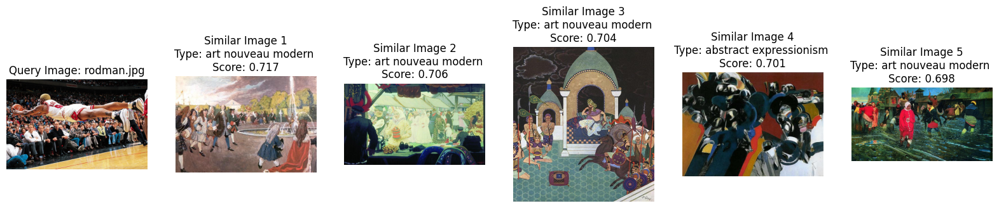

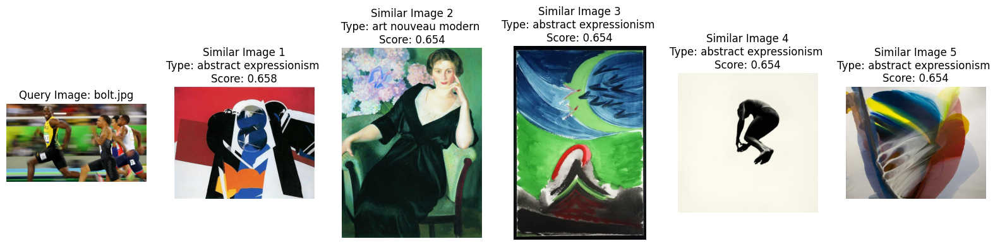

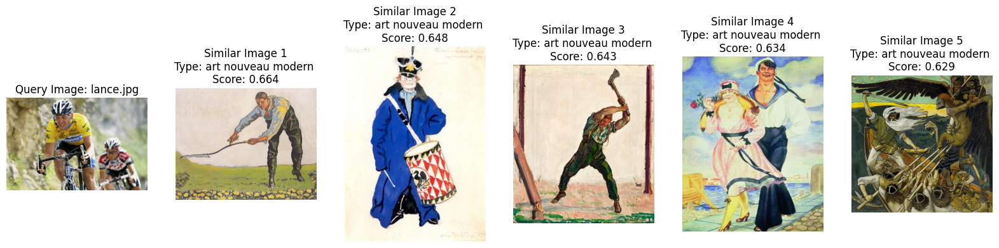

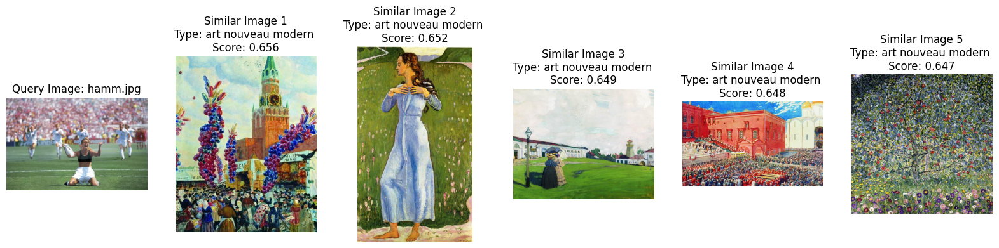

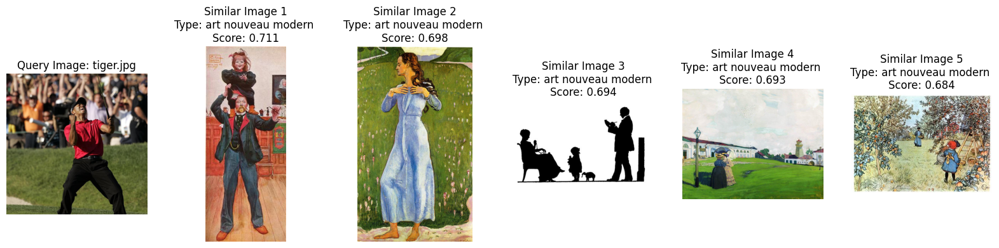

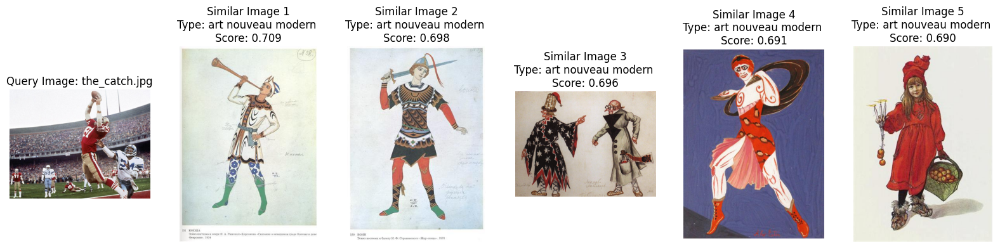

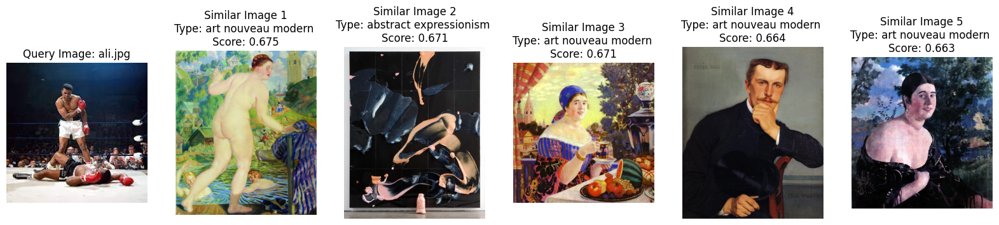

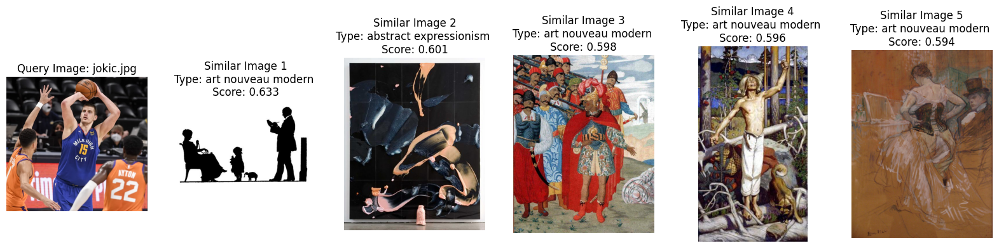

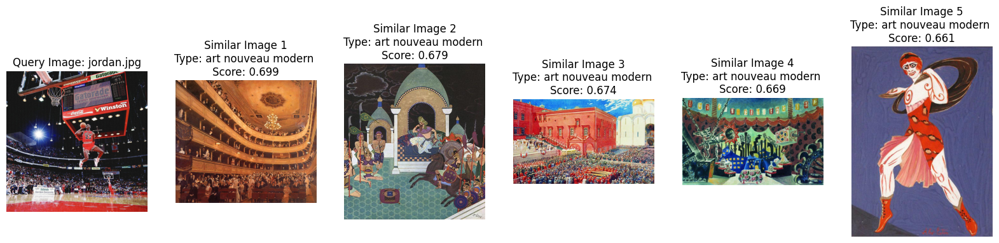

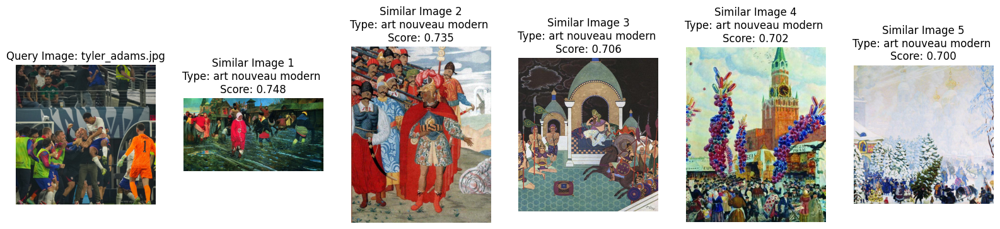

In [24]:
# Get images in test-images folder
test_images = [os.path.join('../data/test-images', item) for item in os.listdir('../data/test-images') if os.path.splitext(item)[-1]=='.jpg']

# Get results for each image
for image in test_images:
    get_results(image)

# Trying Again but with Greyscale Images

In [26]:
images_paths = [os.path.join('images', item) for item in os.listdir('images') if os.path.splitext(item)[-1]=='.jpg']
images_paths[:5]

['images/art_nouveau_modern_4482.jpg',
 'images/abstract_expressionism_1303.jpg',
 'images/abstract_expressionism_1465.jpg',
 'images/abstract_expressionism_996.jpg',
 'images/action_painting_2879.jpg']

In [27]:
grey_image_path = 'grey-images'

# Empty grey images folder
os.system(f'rm -rf {grey_image_path}')

# Create grey images folder
os.system(f'mkdir {grey_image_path}')

# Convert images to grey scale
for i, image_path in enumerate(tqdm(images_paths)):

    # Load image
    img = plt.imread(image_path)

    # Convert to grey scale
    grey_img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])

    # Save image
    plt.imsave(f'{grey_image_path}/{os.path.basename(image_path)}', grey_img, cmap='gray')


100%|██████████| 5000/5000 [04:14<00:00, 19.61it/s]


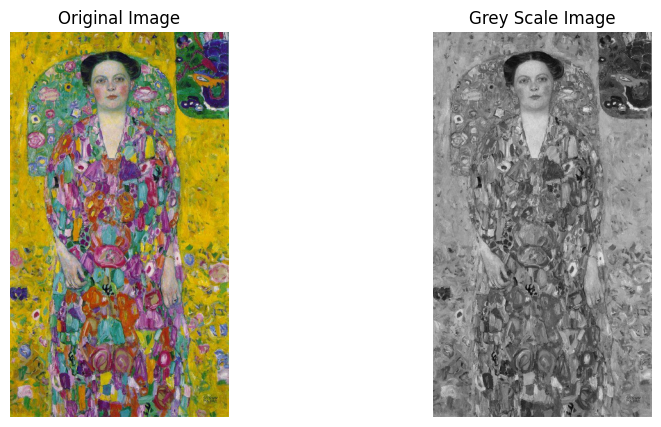

In [29]:
# Show an image and its grey scale version
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Load image
img = plt.imread(images_paths[0])
grey_img = plt.imread(os.path.join(grey_image_path, os.path.basename(images_paths[0])))

# Plot image
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot grey image
ax[1].imshow(grey_img, cmap='gray')
ax[1].set_title('Grey Scale Image')
ax[1].axis('off')

# Show plot
plt.show()

In [30]:
from deeplake.core.vectorstore.deeplake_vectorstore import VectorStore

# Path to the vector store
grey_vector_store_path = 'grey_vector_store/'

# Empty the vector store
## Will get an error if it has anything in it
if os.path.exists(vector_store_path):
    os.system(f'rm -r {vector_store_path}')
os.makedirs(vector_store_path)

# Create the vector store
grey_vector_store = VectorStore(
    path = grey_vector_store_path,
    tensor_params = [{'name': 'image', 'htype': 'image', 'sample_compression': 'jpg'}, 
                     {'name': 'embedding', 'htype': 'embedding'}, 
                     {'name': 'filename', 'htype': 'text'}],
)

In [32]:
import os

# Get all image filenames
grey_images_path = 'grey-images/'
grey_image_fns = [os.path.join(grey_images_path, item) for item in os.listdir(grey_images_path) if os.path.splitext(item)[-1]=='.jpg']
grey_image_fns[:5]

['grey-images/art_nouveau_modern_4482.jpg',
 'grey-images/abstract_expressionism_1303.jpg',
 'grey-images/abstract_expressionism_1465.jpg',
 'grey-images/abstract_expressionism_996.jpg',
 'grey-images/action_painting_2879.jpg']

In [33]:
# Add to vector store
grey_vector_store.add(image = grey_image_fns,
                 filename = grey_image_fns,
                 embedding_function = embedding_function, 
                 embedding_data = grey_image_fns)

Creating 5000 embeddings in 10 batches of size 500:: 100%|██████████| 10/10 [08:31<00:00, 51.14s/it]

Dataset(path='grey_vector_store/', tensors=['image', 'embedding', 'filename', 'id'])

  tensor      htype                shape               dtype  compression
  -------    -------              -------             -------  ------- 
   image      image    (5000, 116:6215, 103:5360, 3)   uint8    jpeg   
 embedding  embedding           (5000, 512)           float32   None   
 filename     text               (5000, 1)              str     None   
    id        text               (5000, 1)              str     None   


In [35]:
# Convert test images to grey scale
test_images = [os.path.join('../data/test-images', item) for item in os.listdir('../data/test-images') if os.path.splitext(item)[-1]=='.jpg']

# Create grey test images folder
os.system('rm -rf ../data/grey-test-images')

# Check if folder exists
if not os.path.exists('../data/grey-test-images'):

    # Create folder
    os.system('mkdir ../data/grey-test-images')

# Convert images to grey scale
for i, image_path in enumerate(tqdm(test_images)):

    # Load image
    img = plt.imread(image_path)

    # Convert to grey scale
    grey_img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])

    # Save image
    plt.imsave(f'../data/grey-test-images/{os.path.basename(image_path)}', grey_img, cmap='gray')

100%|██████████| 10/10 [00:00<00:00, 10.02it/s]


In [36]:
# Function to get results and plot them
## k = number of similar images to get
def grey_get_results(image_path,  k=5):

    # Get results from vector store
    result = grey_vector_store.search(embedding_data=image_path, embedding_function=embedding_function, k=k)

    # Get image name of the first image
    image_name = os.path.basename(image_path)

    color_image_path = image_path.replace('grey-test-images', 'test-images')

    # Plot one image and the 5 most similar images
    fig, ax = plt.subplots(1, k+1, figsize=(20, 4))
    ax[0].imshow(plt.imread(color_image_path))
    ax[0].set_title('Query Image: ' + image_name)
    ax[0].axis('off')

    for i in range(k):

        # Get image data
        filename = result['filename'][i]

        # Get colored image
        filename = filename.replace('grey-images', 'images')
        color_image = plt.imread(filename)
        
        # Remove any numbers
        label = filename.rstrip('.jpg').split('/')[-1]
        label = ''.join([i for i in label if not i.isdigit()])

        # Remove any underscores
        label = label.replace('_', ' ')
        similarity = result['score'][i]

        # Plot image
        ax[i+1].imshow(color_image)
        ax[i+1].set_title(f'Similar Image {i+1}\nType: {label}\nScore: {similarity:.3f}')
        ax[i+1].axis('off')

    # Show plot
    plt.show()

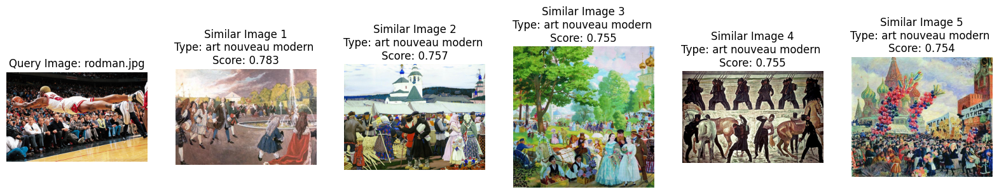

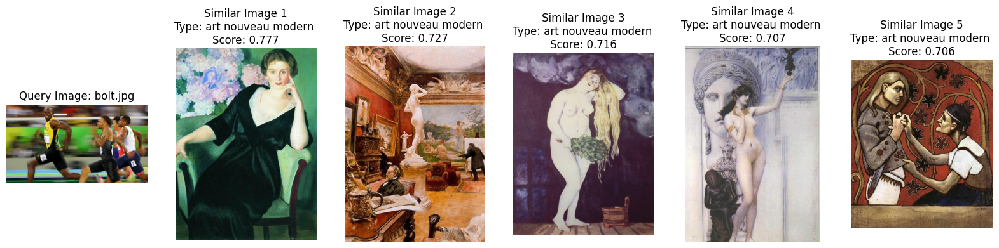

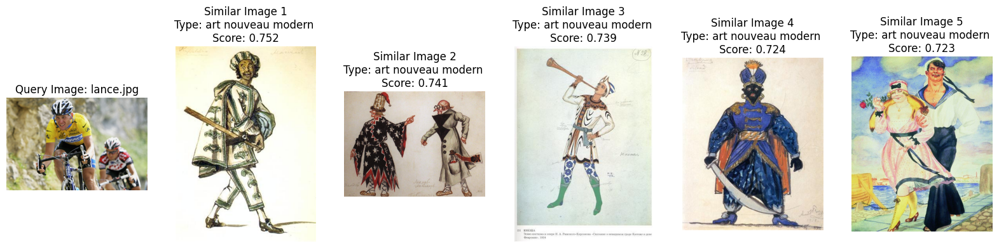

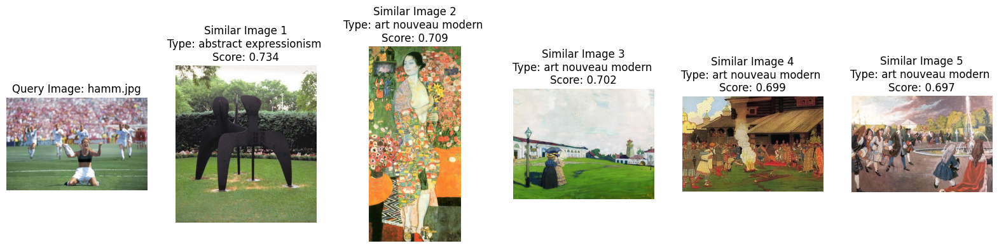

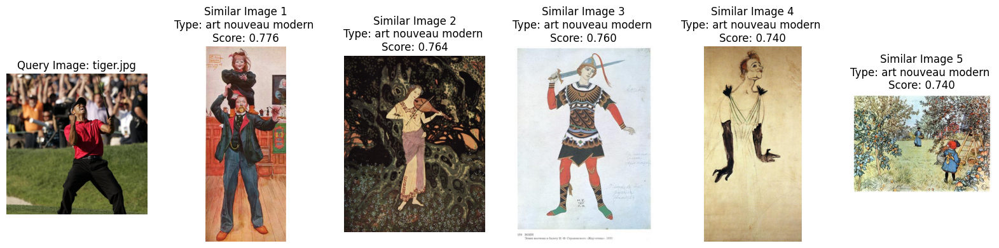

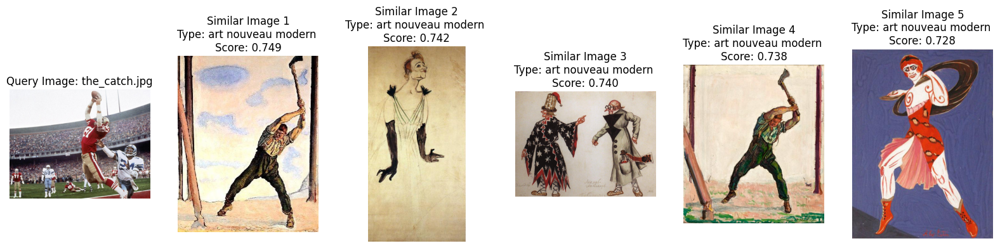

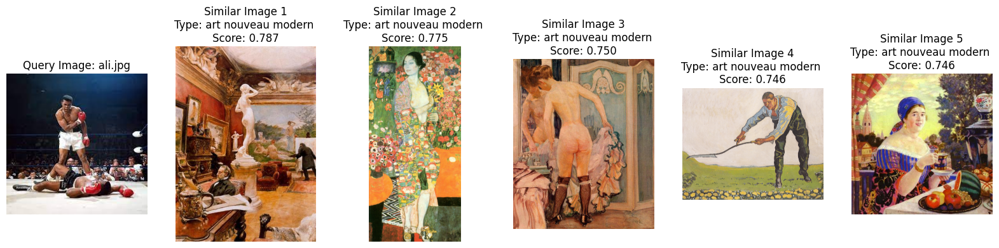

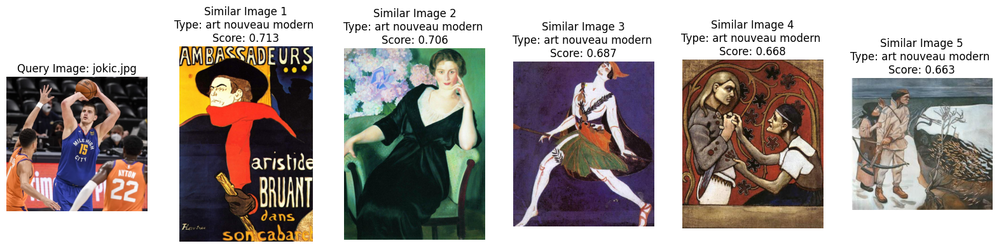

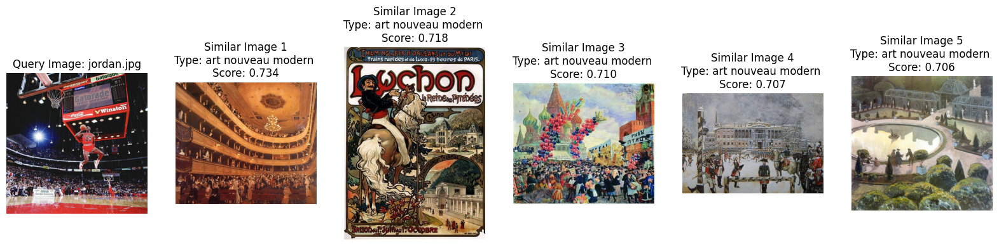

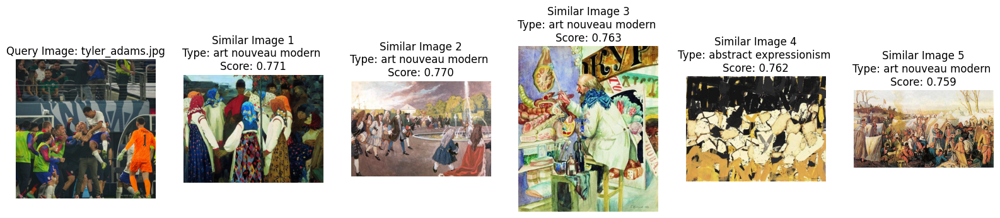

In [37]:
# Get images in test-images folder
grey_test_images = [os.path.join('../data/grey-test-images', item) for item in os.listdir('../data/grey-test-images') if os.path.splitext(item)[-1]=='.jpg']

# Get results for each image
for image in grey_test_images:
    grey_get_results(image)